# Part 1, Topic 1, Lab A: Resynchronizing Traces with Sum of Absolute Difference

---
NOTE: This lab references some (commercial) training material on [ChipWhisperer.io](https://www.ChipWhisperer.io). You can freely execute and use the lab per the open-source license (including using it in your own courses if you distribute similarly), but you must maintain notice about this source location. Consider joining our training course to enjoy the full experience.

---

**SUMMARY:** *At the end of SCA101, you saw how the communication lines of a microcontroller can be used as a trigger in a side channel attack. This attack was made much more difficult by the presence of jitter; the traces didn't all line up with each other. One thing you might have asked after that lab was if jitter can be used as a countermeasure to a CPA attack. If our target introduces enough jitter, will our CPA attack become impractical?*

*In this lab, we'll look at how jitter-based countermeasures can be overcome by resynchronizing the traces. More specifically, we'll use the sum of absolute difference (SAD) measure that we last looked at early on in SCA101.* 

**LEARNING OUTCOMES:**
* Attempting a CPA attack againt a jittery AES implementation
* Writing code to resynchronize traces using SAD
* Using ChipWhisperer Analyzer to resynchronize traces.

## Prerequisites

This lab will build upon the material in SCA101. In particular, you may want to have a quick look over the following labs:

* Lab 2_1 (We used SAD to crack the password here)
* Lab 5_1 (You saw how jittery traces can disrupt a CPA attack)
* Lab 4_3 (Intro to ChipWhisperer Analyzer)

In [ ]:
SCOPETYPE = 'OPENADC'
PLATFORM = 'CWLITEARM'
CRYPTO_TARGET = 'TINYAES128C'
VERSION = 'HARDWARE'
SS_VER = 'SS_VER_1_1'

In [1]:
SCOPETYPE = 'OPENADC'
PLATFORM = 'CWHUSKY'
CRYPTO_TARGET = 'TINYAES128C'
SS_VER='SS_VER_1_1'

In [2]:
%run "../../Setup_Scripts/Setup_Generic.ipynb"

INFO: Found ChipWhisperer😍
scope.gain.gain                          changed from 0                         to 22                       
scope.gain.db                            changed from 15.0                      to 25.091743119266056       
scope.adc.samples                        changed from 131124                    to 5000                     
scope.clock.clkgen_freq                  changed from 0                         to 7363636.363636363        
scope.clock.adc_freq                     changed from 0                         to 29454545.454545453       
scope.clock.adc_rate                     changed from 0.0                       to 29454545.454545453       
scope.io.tio1                            changed from serial_tx                 to serial_rx                
scope.io.tio2                            changed from serial_rx                 to serial_tx                
scope.io.hs2                             changed from None                      to clkgen            

In [3]:
%%bash -s "$PLATFORM" "$CRYPTO_TARGET" "$SS_VER"
cd ../../../firmware/mcu/simpleserial-aes
make PLATFORM=$1 CRYPTO_TARGET=$2 EXTRA_OPTS=ADD_JITTER SS_VER=$3

Building for platform CWHUSKY with CRYPTO_TARGET=TINYAES128C
SS_VER set to SS_VER_1_1
SS_VER set to SS_VER_1_1
Blank crypto options, building for AES128
.
Welcome to another exciting ChipWhisperer target build!!
arm-none-eabi-gcc (GNU Arm Embedded Toolchain 10.3-2021.10) 10.3.1 20210824 (release)
Copyright (C) 2020 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.

mkdir -p objdir-CWHUSKY 
.
Compiling:
-en     simpleserial-aes.c ...


simpleserial-aes.c: In function 'get_pt':
simpleserial-aes.c:44:3: warning: this 'for' clause does not guard... [-Wmisleading-indentation]
   44 |   for (volatile uint8_t k = 0; k < (*pt & 0x0F); k++);
      |   ^~~
simpleserial-aes.c:47:2: note: ...this statement, but the latter is misleadingly indented as if it were guarded by the 'for'
   47 |  aes_indep_enc(pt); /* encrypting the data block */
      |  ^~~~~~~~~~~~~


-e Done!
.
Compiling:
-en     .././simpleserial/simpleserial.c ...
-e Done!
.
Compiling:
-en     .././hal/hal.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/startup_sam4s.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/sam4s_hal.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/uart.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/pio.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/system_sam4s.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/sysclk.c ...
-e Done!
.
Compiling:
-en     .././hal//sam4s/pmc.c ...
-e Done!
.
Compiling:
-en     .././crypto/tiny-AES128-C/aes.c ...
-e Done!
.
Compiling:
-en     .././crypto/aes-independant.c ...
-e Done!
.
LINKING:
-en     simpleserial-aes-CWHUSKY.elf ...
Memory region         Used Size  Region Size  %age Used
             rom:        3872 B       128 KB      2.95%
             ram:          5 KB        64 KB      7.81%
-e Done!
.
Creating load file for Flash: simpleserial-aes-CWHUSKY.hex
arm-none-eabi-objcopy -O ihex -R .

In [4]:
cw.program_target(scope, prog, "../../../firmware/mcu/simpleserial-aes/simpleserial-aes-{}.hex".format(PLATFORM))

In [15]:
scope.gain.db = 23

In [16]:
from tqdm.notebook import trange
import numpy as np
import time

ktp = cw.ktp.Basic()
trace_array = []
textin_array = []


proj = cw.create_project("traces/Lab_Resync.cwp", overwrite=True)

N = 200
for i in trange(N, desc='Capturing traces'):
    key, text = ktp.next()
    trace = cw.capture_trace(scope, target, text, key)
    if not trace:
        continue
    
    proj.traces.append(trace)
proj.save()

Capturing traces:   0%|          | 0/200 [00:00<?, ?it/s]

In [59]:
scope.dis()

True

In [19]:
print(scope.errors)
scope.errors.clear()

sam_errors      = False
sam_led_setting = Default
XADC errors     = False
ADC errors      = False
extclk error    = False
trace errors    = False



## CPA Against Jittery Traces

As a first test, let's try plotting a few traces:

In [22]:
list(proj.waves)

[array([-0.25      , -0.18066406, -0.08764648, ..., -0.13623047,
        -0.07373047,  0.00708008]),
 array([-0.24584961, -0.17724609, -0.09423828, ...,  0.07470703,
         0.08325195,  0.10498047]),
 array([-0.2578125 , -0.17285156, -0.09033203, ..., -0.15600586,
        -0.07836914, -0.00292969]),
 array([-0.2590332 , -0.17089844, -0.07373047, ...,  0.05322266,
         0.08081055,  0.1184082 ]),
 array([-0.25952148, -0.16918945, -0.08496094, ..., -0.15429688,
        -0.07446289,  0.0090332 ]),
 array([-0.25463867, -0.17871094, -0.08911133, ..., -0.18066406,
        -0.10717773, -0.01513672]),
 array([-0.24707031, -0.15673828, -0.08349609, ..., -0.15893555,
        -0.08227539, -0.00341797]),
 array([-0.24951172, -0.16088867, -0.08764648, ...,  0.05541992,
         0.07641602,  0.10717773]),
 array([-0.24951172, -0.16235352, -0.07250977, ..., -0.140625  ,
        -0.07324219,  0.01245117]),
 array([-0.25146484, -0.15722656, -0.07714844, ..., -0.17236328,
        -0.08789062, -0.05

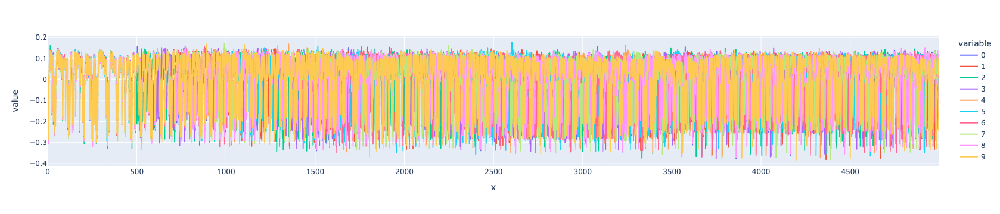

In [60]:
import plotly.express as px
import pandas as pd

data = {}

for i in range(10):
    data[str(i)] = proj.waves[i]

data['x'] = list(range(len(proj.waves[0])))
data_frame = pd.DataFrame(data)
px.line(data_frame, x='x', y=[str(i) for i in range(10)])

which looks fairly discouraging. Remember that for a CPA attack, we're calculation correlation across our trace set by point, meaning if the SBox output for one trace is in a different spot than the rest, it will decrease the correlation, not increase it. It probably won't end well, but let's try an attack anyway:

In [27]:
import chipwhisperer.analyzer as cwa
leak_model = cwa.leakage_models.sbox_output
attack = cwa.cpa(proj, leak_model)
cb = cwa.get_jupyter_callback(attack)
results = attack.run(cb)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
PGE=,251,213,211,125,229,83,96,169,106,238,144,12,159,25,54,235
0,130.430,620.361,3F0.355,790.347,D10.313,110.332,320.343,580.355,DC0.309,A30.309,6A0.331,8E0.362,130.331,E30.336,AC0.398,760.331
1,BE0.424,1F0.357,DE0.344,6C0.342,B70.308,170.326,820.337,AA0.352,ED0.306,A90.303,890.318,830.320,630.324,D90.322,940.331,2B0.329
2,D80.405,A60.338,050.327,CF0.322,810.305,4B0.322,9C0.336,260.322,F80.306,FF0.287,8C0.311,7B0.311,5B0.319,FC0.308,CD0.324,430.310
3,020.393,990.308,EF0.323,650.309,050.297,1F0.307,4D0.313,630.311,C10.299,780.287,B30.311,B50.309,050.318,C60.305,C20.320,690.301
4,9E0.383,770.307,960.320,680.301,600.296,CF0.302,DF0.312,2D0.303,150.298,760.283,170.310,0E0.308,430.317,DE0.303,890.319,110.299


As expected, the attack completely failed. 

## Manual SAD Resync

In concept at least, we have a similar situation to the password bypass, except this time the time difference between the traces is an obstacle instead of a vulnerability we're exploiting. We can actually use a very similar technique to figure out how much the traces have shifted! The only modification to the SAD calculation we need to make is that we'll need to use a subset of our reference trace as the reference instead. This means we won't have to figure out how to deal with the parts of the trace that are shifted outside the capture window.

To find the offset, all we need to do is slide the reference along the trace we're trying to resyncronize, calculating the SAD at each offset. The difference between the offset we picked for our reference and the offset with the lowest SAD will be our timeshift! In practise, we can skip finding all the offsets and just use the first offset that falls below a threshold like we did in the password bypass. If we captured a much longer power trace that had all the rounds of AES, this would also have the advantage of not accidentally matching with a later round.

To start, make a function that figures out the offset between two traces using SAD:

In [189]:
def calculate_trace_offset(ref_trace, orig_offset, target_trace, threshold):
    ref_len = len(ref_trace)
    for i in range(0, len(target_trace) - ref_len):    
        SAD_SUM = sum([abs(target_trace[i + j] - ref_trace[j]) for j in range(0, ref_len)])
        if SAD_SUM < threshold:
            return i - orig_offset
    print("error")
    return 0

In [40]:
a = np.arange(50)
b = np.arange(70)[20:]
assert calculate_trace_offset(a[35:40], 35, b, 1) == -20
assert calculate_trace_offset(a[35:40], 35, b, 29) == -25

Next, let's pick a reference trace. First, let's plot the first trace. Some stuff to keep in mind:
* We want it to be fairly "unique" - we don't want something earlier or later on to also match easily.
* The maximum offset, and therefore shift, we can get is limited how close the reference is to the edges of the power trace.
* This isn't really a concern for this lab, but we don't want it to be unique per trace. For example, if your trigger was a bit earlier (think the UART lab), the transition between serial communication and AES is very distinct. It's a bad SAD location, however, since the serial part varies a lot between traces

for example:

![](img/Resync_traces_ref.png)

the reference in green would be a good spot to pick, while the reference in red would be a poor choice

There's a bit of a learning curve to this, so don't be afraid to come back and select a different reference trace if you find it's not working well when trying to resynchronize other traces.

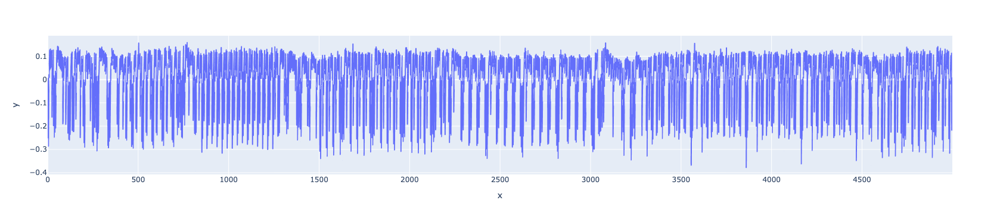

In [119]:
data = {
    'x': list(range(len(proj.waves[0]))),
    'y': proj.waves[0]
}
data_frame = pd.DataFrame(data)
px.line(data_frame, x='x', y='y')

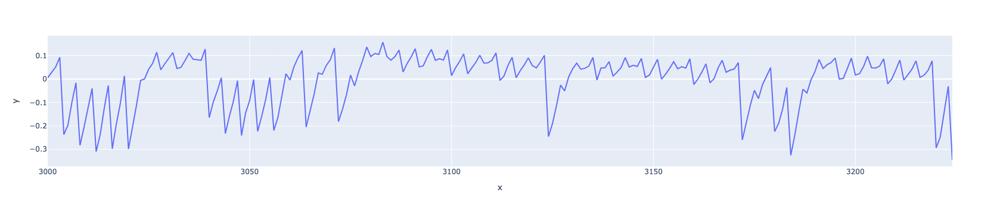

In [62]:
ref_start = 3000
ref_end = 3225
ref_trace = proj.waves[0][ref_start:ref_end]

data = {
    'x': [i for i in range(ref_start, ref_end)],
    'y': ref_trace
}
data_frame = pd.DataFrame(data)
px.line(data_frame, x='x', y='y')

One thing we can do is slide our reference along another trace and calculate the SAD at each point. This should be similar to your SAD offset function earlier:

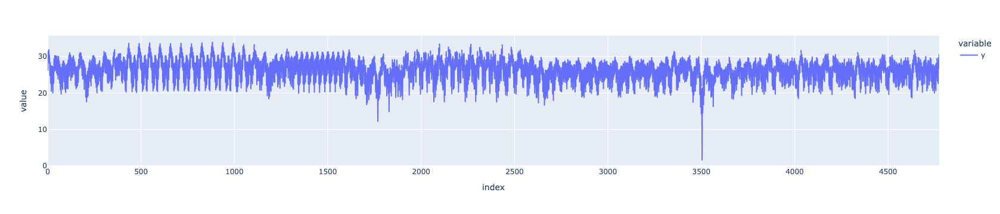

In [63]:
def get_sad_plot(ref_trace, target_trace):
    ref_len = len(ref_trace)
    sads = []
    for i in range(0, len(target_trace) - ref_len):
        sads.append(np.sum(abs(ref_trace-target_trace[i:i+ref_len])))
    return sads

data = {'y': get_sad_plot(ref_trace, proj.waves[1])}
data_frame = pd.DataFrame(data)
px.line(data_frame)

If you don't see a single downward spike:

![](img/GoodVBadRef.png)

instead of a few spikes, you'll want to select a different reference. You can also use this plot to get an idea of what sort of threshold to use.

Anyway, try it on some different traces. You should get a varying amount offsets.

Now that we can easily get how much our trace is offset by, let's see if the plots actually line up:

504


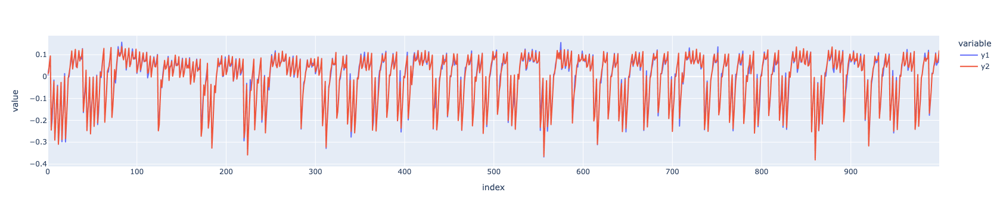

In [77]:
original_offset = 3000
target_offset = calculate_trace_offset(ref_trace, original_offset, proj.waves[1], 10)
offset_len = 1000

print(target_offset)

data = {'y1': proj.waves[0][original_offset:original_offset+offset_len],
        'y2': proj.waves[1][original_offset+target_offset:original_offset+target_offset+offset_len]}
data_frame = pd.DataFrame(data)
px.line(data_frame, y=['y1', 'y2'])

Looks good! Try plotting a few different traces, however, and you'll run into a problem: how do we deal with a trace that needs to be shifted forward? There's a related problem for our CPA attack well: we need all the traces to be the same length, but if we move traces backwards, we won't have any data at the end, meaning the traces will be shorter than usual. The easiest way to deal with these problems is just to fill in the rest of the data with zeros:

In [212]:
#target_offset2 = calculate_trace_offset(ref_trace, original_offset, proj.waves[5], 10)
#print(target_offset2)
#new_trace = np.zeros(len(proj.waves[0]))
#new_trace[-target_offset2:] = proj.waves[5][:target_offset2]

def resynchronize_traces(start_trace, original_offset=3000, examine_width=225, wave_indecies=[2], traces=[], width=1000, threshold=10, debug=False, recenter=True):
    ref_trace = start_trace[original_offset:original_offset + examine_width]
    data = {}

    trace_items = proj.waves if len(traces) == 0 else traces
    trace_length = len(trace_items[0])

    for wave_index in wave_indecies:
        examined_wave = trace_items[wave_index]

        if len(examined_wave) == 0:
            continue
        
        target_offset2 = calculate_trace_offset(ref_trace, original_offset, examined_wave, threshold)
        target_index = original_offset + target_offset2

        if recenter:
            data[f'wave_{wave_index}'] = np.zeros(trace_length)
        else:
            data[f'wave_{wave_index}'] = np.zeros(width)
    
        if recenter and target_offset2 == 0:
            data[f'wave_{wave_index}'] = examined_wave[:trace_length]
        elif recenter and target_offset2 < 0:
            data[f'wave_{wave_index}'][:trace_length] = examined_wave[target_offset2:target_offset2 + trace_length]
        elif recenter:
            data[f'wave_{wave_index}'][:trace_length] = examined_wave[target_offset2:target_offset2 + trace_length]
        elif debug and target_offset2 == 0:
            print(f'wave_{wave_index} no shift')
            data[f'wave_{wave_index}'] = examined_wave[target_index:target_index + width]
        elif debug and target_offset2 < 0:
            print(f'wave_{wave_index} shift backward: {target_offset2:4}')
            data[f'wave_{wave_index}'][:width] = examined_wave[target_index:target_index + width]
        elif debug:
            print(f'wave_{wave_index} shift forward:  {target_offset2:4}')
            wave_sample_len = len(examined_wave[target_index:target_index + width])
            data[f'wave_{wave_index}'][:wave_sample_len] = examined_wave[target_index:target_index + width]
        elif target_offset2 == 0:
            data[f'wave_{wave_index}'] = examined_wave[target_index:target_index + width]
        elif target_offset2 < 0:
            data[f'wave_{wave_index}'][:width] = examined_wave[target_index:target_index + width]
        else:
            wave_sample_len = len(examined_wave[target_index:target_index + width])
            data[f'wave_{wave_index}'][:wave_sample_len] = examined_wave[target_index:target_index + width]

    return data

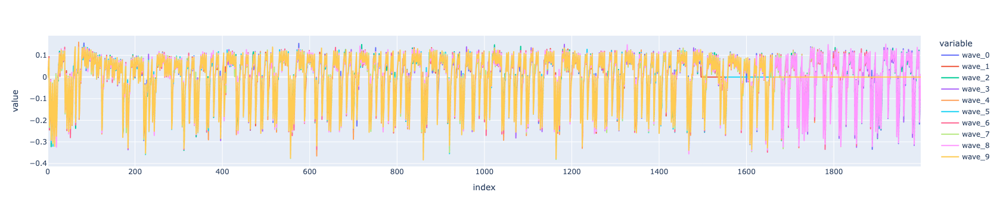

In [213]:
px.line(pd.DataFrame(resynchronize_traces(proj.waves[0],wave_indecies=list(range(10)),width=2000,debug=False)))

Anyway, take what we've done and use it to make a function that takes in a trace and returns one that's resynchronized with the reference.

**HINT: You'll need to handle 3 cases: offset > 0, offset < 0, and offset = 0**

In [152]:
# Note done with resynchronize_traces(ref_trace, original_offset=3000, wave_indecies=[2], width=1000)
def resync_with_SAD(ref_trace, offset, trace_wave, threshold):
    data = resynchronize_traces(ref_trace,
                                original_offset=offset,
                                wave_indecies=[0],
                                traces=[trace_wave],
                                width=2000,
                                threshold=threshold,
                                debug=False)
    return data['wave_0']

Let's test it out on some jittery traces:

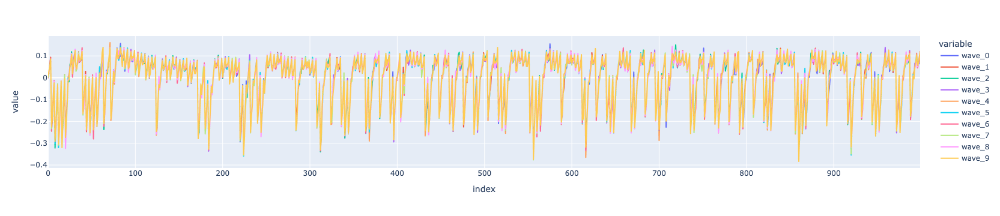

In [221]:
# Note done with resynchronize_traces(ref_trace, original_offset=3000, wave_indecies=[2], width=1000)
#traces = [resync_with_SAD(ref_trace, 3000, proj.waves[i], 10) for i in range(10)]
px.line(pd.DataFrame(resynchronize_traces(proj.waves[0],
                                          wave_indecies=list(range(10)),
                                          traces=proj.waves)))

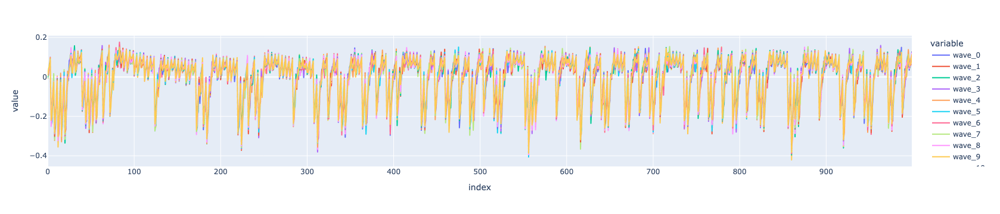

In [237]:
data_frame_waves = pd.DataFrame(resynchronize_traces(proj.waves[0],
                                                     wave_indecies=list(range(len(proj.waves))),
                                                     traces=proj.waves))
px.line(data_frame_waves)

In [267]:
data_frame_traces = pd.DataFrame(resynchronize_traces(proj.waves[0],
                                                      wave_indecies=list(range(len(proj.traces))),
                                                      width=2000,
                                                      traces=[trace.wave for trace in proj.traces]))
px.line(data_frame_traces)

Hopefully all your traces lined up perfectly. If not, you might have to go back and select another reference or adjust your `resync_with_SAD()` function.

Let's make a new project, resynchronize our traces, and insert them into that:

In [270]:
resync_proj = cw.create_project("Lab 1_1_Resync", overwrite=True)

for i in range(len(proj.traces)):
    new_trace = cw.Trace(list(data_frame_traces[f'wave_{i}']), proj.traces[i].textin, proj.traces[i].textout, proj.traces[i].key)
    resync_proj.traces.append(new_trace)
    

#for i in range(1,len(proj.traces)):
#    new_trace = cw.Trace(data[f'wave_{i}'], trace.textin, trace.textout, trace.key)
#    resync_proj.traces.append(new_trace)

#for trace in proj.traces:
#    resync_wave = resync_with_SAD(ref_trace, 3000, trace.wave, 10)
#    new_trace = cw.Trace(resync_wave, trace.textin, trace.textout, trace.key)
#    resync_proj.traces.append(new_trace)

and let's retry the attack:

In [271]:
import chipwhisperer.analyzer as cwa
leak_model = cwa.leakage_models.sbox_output
attack = cwa.cpa(resync_proj, leak_model)
cb = cwa.get_jupyter_callback(attack)
results = attack.run(cb)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
PGE=,4,0,0,2,0,0,0,0,16,0,0,0,53,0,0,0
0,660.370,7E0.479,150.639,7A0.330,280.367,AE0.629,D20.517,A60.671,DC0.317,F70.702,150.696,880.645,260.323,CF0.700,4F0.594,3C0.631
1,BB0.343,F20.345,A20.344,FD0.317,ED0.318,560.323,6A0.328,220.322,D00.316,330.349,CD0.316,700.381,7D0.314,B20.337,890.325,AB0.322
2,2E0.338,260.335,5A0.331,160.316,FF0.314,210.321,D80.327,530.321,310.312,190.337,FA0.314,4A0.334,630.313,F10.316,3C0.318,BD0.314
3,B50.338,5F0.329,690.316,F10.309,590.304,4F0.315,4A0.323,E10.311,870.310,DF0.317,060.313,3A0.312,020.308,B80.312,210.313,B70.304
4,2B0.328,F30.325,5F0.307,720.307,E00.298,160.313,010.305,130.301,9B0.309,6A0.306,B40.310,3B0.311,C60.307,EC0.311,700.305,470.301


You should see the attack succeed this time!

In [ ]:
assert [results.simple_PGE(i) for i in range(16)] == [0]*16

## SAD Resync with ChipWhisperer Analyzer

Like with the CPA attack itself, ChipWhisperer Analyzer can make our lives a lot easier:

In [265]:
resync_traces = cwa.preprocessing.ResyncSAD(proj)
resync_traces.ref_trace = 0
resync_traces.target_window = (3000, 3225)
resync_traces.max_shift = 1000
resync_analyzer = resync_traces.preprocess()

100%|██████████| 200/200 [00:02<00:00, 70.17it/s]


All these settings should look familiar except `max_shift`, which will cause the ResyncSAD object to discard a trace if it needs to be shifted more than `max_shift`. Why is this useful? Consider the case where there's enough jitter to move the point we're looking at outside of what we captured. It would be much better to simply discard this trace, rather than including it and having it disrupt our data.

Anyway, plotting 10 resychronized traces:

In [ ]:
plt = cw.plot([])
for i in range(10):
    plt *= cw.plot(resync_analyzer.waves[i])
plt

You should find that everything is resychronized, just as it was from our code. Running the attack again:

In [266]:
import chipwhisperer.analyzer as cwa
leak_model = cwa.leakage_models.sbox_output
attack = cwa.cpa(resync_analyzer, leak_model)
cb = cwa.get_jupyter_callback(attack)
results = attack.run(cb)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
PGE=,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
0,2B0.700,7E0.730,150.770,160.727,280.732,AE0.757,D20.780,A60.748,AB0.775,F70.702,150.788,880.763,090.766,CF0.740,4F0.781,3C0.723
1,130.412,F20.345,A20.344,AB0.336,8C0.342,0A0.362,E70.334,A50.333,730.323,E40.354,C20.341,700.381,260.323,990.349,820.338,700.358
2,660.370,900.342,7B0.339,6C0.334,F70.334,0D0.340,6A0.328,2D0.333,840.318,330.349,E90.322,4A0.334,F20.321,B20.337,890.325,4F0.347
3,BE0.367,A80.337,5A0.331,7A0.330,0F0.325,560.323,D80.327,ED0.328,DC0.317,190.337,FB0.317,BC0.316,7D0.314,6F0.329,3C0.318,AB0.322
4,A80.350,260.335,690.316,030.321,F30.319,210.321,4A0.323,220.322,D00.316,390.318,CD0.316,3A0.312,8E0.314,250.327,480.318,250.314


which easily succeeds.

In [ ]:
assert [results.simple_PGE(i) for i in range(16)] == [0]*16

## Conclusions & Next Steps

In this lab, you saw how we can resychronize traces using sum of absolute difference, allowing us to overcome jittery traces. With two uses of SAD under your belt, you should start to see how it is a useful metric for comparing two power traces, as it is both simple and effective. If you're looking for another usecase for SAD in the ChipWhisperer project, we also have it available as a trigger for the CW1200. This allows you to trigger based on the shape of a wave. In the case of our simple attack, it would completely remove the need for a trigger pin!

---
<small>NO-FUN DISCLAIMER: This material is Copyright (C) NewAE Technology Inc., 2015-2020. ChipWhisperer is a trademark of NewAE Technology Inc., claimed in all jurisdictions, and registered in at least the United States of America, European Union, and Peoples Republic of China.

Tutorials derived from our open-source work must be released under the associated open-source license, and notice of the source must be *clearly displayed*. Only original copyright holders may license or authorize other distribution - while NewAE Technology Inc. holds the copyright for many tutorials, the github repository includes community contributions which we cannot license under special terms and **must** be maintained as an open-source release. Please contact us for special permissions (where possible).

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.</small>